# Package Installation

In [1]:
!pip install rembg

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 40.8/40.8 kB 1.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 54.5/54.5 kB 3.0 MB/s eta 0:00:00


In [2]:
!pip install onnxruntime

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.3/13.3 MB 91.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 46.0/46.0 kB 5.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.8/86.8 kB 9.7 MB/s eta 0:00:00


# Library Importation

In [3]:
import os
import cv2
import numpy as np
from rembg import remove
from PIL import Image, ImageOps
import matplotlib.pyplot as plt

# Connection with Google Drive

In [4]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


# Contours Method

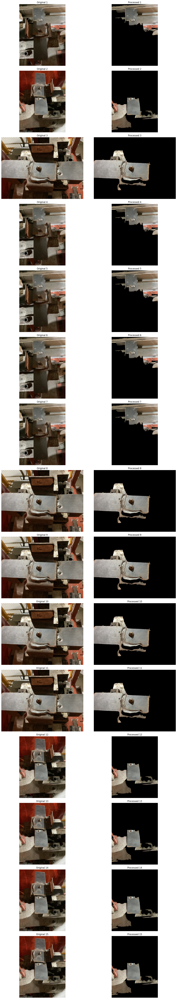

In [5]:
# Upload folder containing images
# Change this path to the folder containing the images to be analysed.
folder_path = '/content/drive/My Drive/Colab Notebooks/Segmentación CIDETEC/CATEGORIES/TEST/SCRAP/'

img_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

rows_num = len(img_files)
plt.figure(figsize=(15, 5 * rows_num))

for i, file in enumerate(img_files):
    img_path = os.path.join(folder_path, file)

    original_img = cv2.imread(img_path)
    original_img  = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    gray_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2GRAY)

    ret, thresh = cv2.threshold(gray_img, np.mean(gray_img), 255, cv2.THRESH_BINARY)

    contours, hierarchy = cv2.findContours(thresh, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)

    cnt = sorted(contours, key=cv2.contourArea) [-1]

    mask = np.zeros(original_img.shape[:2], np.uint8)

    maskedRed = cv2.drawContours(mask, [cnt], -1, (0, 0, 255), -1)
    maskedFinal = cv2.drawContours(mask, [cnt], -1, (255, 255, 255), -1)

    FinalImage = cv2.bitwise_and(original_img, original_img, mask=maskedFinal)

    plt.subplot(rows_num, 2, 2 * i + 1)
    plt.imshow(original_img)
    plt.axis('off')
    plt.title(f"Original {i+1}")

    plt.subplot(rows_num, 2, 2 * i + 2)
    plt.imshow(FinalImage)
    plt.axis('off')
    plt.title(f"Processed {i+1}")

plt.tight_layout()
plt.show()

# Neural network-based segmentation method

100%|████████████████████████████████████████| 176M/176M [00:00<00:00, 165GB/s]


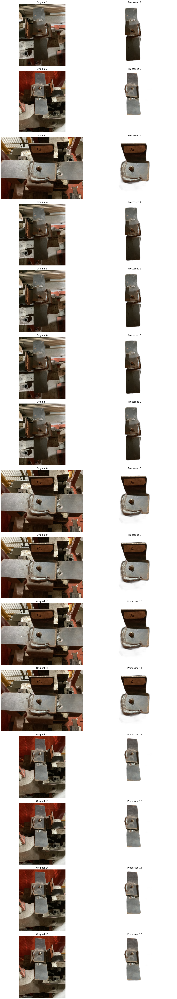

In [6]:
# Upload folder containing images
# Change this path to the folder containing the images to be analysed.
folder_path = '/content/drive/My Drive/Colab Notebooks/Segmentación CIDETEC/CATEGORIES/TEST/SCRAP/'

img_files = [f for f in os.listdir(folder_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Definir el tamaño del gráfico
rows_num = len(img_files)
plt.figure(figsize=(15, 5 * rows_num))

# Iterar sobre las imágenes
for i, file in enumerate(img_files):
    # Ruta de la imagen original
    img_path = os.path.join(folder_path, file)

    # Leer y almacenar la imagen original
    original_img = cv2.imread(img_path)
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)  # Convertir de BGR a RGB para Matplotlib

    # Procesar la imagen con rembg
    inp = Image.open(img_path)
    processed_img = remove(inp)  # Esto devuelve directamente una imagen de tipo PIL

    #Obtención de la máscara binaria
    umbral = np.mean(processed_img)
    binary_mask = processed_img.point(lambda p: 255 if p > umbral else 0)

    # Mostrar la imagen original en la columna izquierda
    plt.subplot(rows_num, 2, 2 * i + 1)
    plt.imshow(original_img)
    plt.axis('off')
    plt.title(f"Original {i+1}")

    # Mostrar la imagen procesada en la columna derecha
    plt.subplot(rows_num , 2, 2 * i + 2)
    plt.imshow(processed_img)
    plt.axis('off')
    plt.title(f"Processed {i+1}")

# Ajustar el diseño
plt.tight_layout()
plt.show()


# Comparison and Similarity between Human Segmentation and Manual Segmentation/Automatic Segmentation

In [11]:
import os
import cv2
import numpy as np
from skimage.metrics import structural_similarity as ssim

# Function to calculate similarity
def similarity(img1, img2):
    gray_img_1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY) # Changed from gray_img_1 to img1
    gray_img_2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY) # Changed from gray_img_2 to img2

    h1, w1 = gray_img_1.shape
    h2, w2 = gray_img_2.shape

    min_h = min(h1, h2)
    min_w = min(w1, w2)

    gray_img_1 = cv2.resize(gray_img_1, (min_w, min_h))
    gray_img_2 = cv2.resize(gray_img_2, (min_w, min_h))

    similarity, _ = ssim(gray_img_1, gray_img_2, full=True)
    return similarity

# Function to compare two folders by order of images
def compare_folders(root_folder1, root_folder2):
    images_folder1 = sorted([f for f in os.listdir(root_folder1) if f.endswith(('.jpg', '.jpeg', '.png'))])
    images_folder2 = sorted([f for f in os.listdir(root_folder2) if f.endswith(('.jpg', '.jpeg', '.png'))])

    if len(images_folder1) != len(images_folder2):
        print(f"Warning: Folders {root_folder1} and {root_folder2} have a different number of images. Skipping...")
        return

    similarities = []

    for img1, img2 in zip(images_folder1, images_folder2):
        root_img_1 = os.path.join(root_folder1, img1)
        root_img_2 = os.path.join(root_folder2, img2)

        img_1 = cv2.imread(root_img_1)
        img_2 = cv2.imread(root_img_2)

        if img_1 is None or img_2 is None:
            print(f"Warning: One of the images could not be loaded. ({img1} or {img2}). Skipping...")
            continue

        Similarity = similarity(img_1, img_2)
        similarities.append(Similarity)

    if similarities:
        average_similarity = np.mean(similarities) * 100  # Convertir a porcentaje
        print(f"Similarity between {root_folder1} and {root_folder2}: {average_similarity:.2f}%")
    else:
        print(f"No images were found for comparison in {root_folder1} y {root_folder2}.")

# Change this path to the folder to be analysed.
segmentation_folder = '/content/drive/My Drive/Colab Notebooks/Segmentación CIDETEC/SEGMENTATION'
categories_folder = '/content/drive/My Drive/Colab Notebooks/Segmentación CIDETEC/CATEGORIES SEGMENTATION'
#contours_segmentation_folder = '/content/drive/My Drive/Colab Notebooks/Segmentación CIDETEC/CONTOURS SEGMENTATION'

for subfolder in ['TRAIN', 'TEST']:
    for category in ['GOOD', 'HUMAN', 'ROBOT', 'SCRAP']:
        segmentation_root = os.path.join(segmentation_folder, subfolder, category)
        categories_root = os.path.join(categories_folder, subfolder, category)

        if not os.path.exists(segmentation_root) or not os.path.exists(categories_root):
            print(f"Warning: One of the folders {segmentation_root} or {categories_root} does not exist. Skipping...")
            continue

        print(f"Comparing {segmentation_root} with {categories_root}:")
        compare_folders(segmentation_root, categories_root)

Comparing /content/drive/My Drive/Colab Notebooks/Segmentación CIDETEC/SEGMENTATION/TRAIN/GOOD with /content/drive/My Drive/Colab Notebooks/Segmentación CIDETEC/CATEGORIES SEGMENTATION/TRAIN/GOOD:
Similarity between /content/drive/My Drive/Colab Notebooks/Segmentación CIDETEC/SEGMENTATION/TRAIN/GOOD and /content/drive/My Drive/Colab Notebooks/Segmentación CIDETEC/CATEGORIES SEGMENTATION/TRAIN/GOOD: 89.48%
Comparing /content/drive/My Drive/Colab Notebooks/Segmentación CIDETEC/SEGMENTATION/TRAIN/HUMAN with /content/drive/My Drive/Colab Notebooks/Segmentación CIDETEC/CATEGORIES SEGMENTATION/TRAIN/HUMAN:
Similarity between /content/drive/My Drive/Colab Notebooks/Segmentación CIDETEC/SEGMENTATION/TRAIN/HUMAN and /content/drive/My Drive/Colab Notebooks/Segmentación CIDETEC/CATEGORIES SEGMENTATION/TRAIN/HUMAN: 91.34%
Comparing /content/drive/My Drive/Colab Notebooks/Segmentación CIDETEC/SEGMENTATION/TRAIN/ROBOT with /content/drive/My Drive/Colab Notebooks/Segmentación CIDETEC/CATEGORIES SEGME